<div style="direction: rtl; line-height: 300%;">
  <font face="XB Zar" size="5">
    <div align="center">
      <font face="IranNastaliq" size="30">
        <p></p>
      </font>
    </div>
    <br>
    <div align="center">
      <font color="brown" size="6">
        معین حسن پور - 40032313
      </font>
    </div>
    <br>
    <div align="center">
      <font color="navy">
        <b><u>تمرین ششم</u> Image Quality Assessment</b>
      

  </font>
</div>
  </font>
</div>
<hr>

<h2>This project aims to implement and compare various image quality assessment metrics to evaluate how different types of image processing (compression, noise addition, filtering) affect image quality. The project will implement four key metrics: Mean Squared Error (MSE), Structural Similarity Index (SSIM), Weighted Mean Squared Error (WMSE), and Figure of Merit (FOM).</div>

<div dir="rtl"> <h1>راهنمای تحلیل معیار های و مقدار شاخص ها در خروجی :</h1><b>

1. MSE (Mean Squared Error) - خطای میانگین مربعات
جهت معیار: کمتر = بهتر


2. SSIM (Structural Similarity Index) - شاخص شباهت ساختاری
جهت معیار: بیشتر = بهتر

محدوده مقادیر: بین 1- تا 1+

مقدار 1 = تصاویر کاملاً یکسان

مقدار 0 = هیچ شباهت ساختاری


3. WMSE (Weighted MSE) - خطای میانگین مربعات وزندار
جهت معیار: کمتر = بهتر (مشابه MSE اما با حساسیت بصری)

تفاوت با MSE:

به مناطق مهم تصویر (مثل لبه‌ها) وزن بیشتری می‌دهد

معمولاً مقادیر آن از MSE کمتر است چون خطاهای مناطق کم‌اهمیت را کم‌تر محاسبه می‌کند

4. FOM (Figure of Merit) - معیار شایستگی
جهت معیار: بیشتر = بهتر

محدوده مقادیر: بین 0 تا 1

مقدار 1 = حفظ کامل لبه‌ها

مقدار 0 = هیچ حفاظتی از لبه‌ها نشده

مخصوص ارزیابی حفظ لبه‌ها پس از پردازش

In [1]:
pip install tabulate

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.2 -> 25.1
[notice] To update, run: C:\Users\admin\AppData\Local\Programs\Python\Python312\python.exe -m pip install --upgrade pip


In [2]:
from tabulate import tabulate
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
from skimage import filters

def generate_hybrid_importance_map(image):
    """ایجاد نقشه اهمیت ترکیبی (لبه + توجه بصری)"""
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image
    edges = cv2.Canny(gray, 100, 200)
    saliency = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)[..., 0] if len(image.shape) == 3 else image
    saliency = cv2.GaussianBlur(saliency, (15, 15), 0)
    importance_map = cv2.addWeighted(edges.astype(float), 0.7, saliency.astype(float), 0.3, 0)
    return importance_map / importance_map.max()

def calculate_wmse(original, processed):
    """محاسبه WMSE با نقشه اهمیت ترکیبی"""
    importance_map = generate_hybrid_importance_map(original)
    squared_errors = (original.astype(float) - processed.astype(float)) ** 2

    if len(squared_errors.shape) == 3:
        weighted_errors = np.sum(squared_errors * np.stack([importance_map]*3, axis=2), axis=2) / 3
    else:
        weighted_errors = squared_errors * importance_map

    return np.mean(weighted_errors)

def calculate_fom(original, processed):
    """محاسبه Figure of Merit (FOM)"""
    def sobel_edges(img):
        return filters.sobel(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) if len(img.shape) == 3 else filters.sobel(img))

    Eo = sobel_edges(original)
    Ep = sobel_edges(processed)
    return np.sum(np.minimum(Eo, Ep)) / np.sum(np.maximum(Eo, Ep))

def apply_distortions(image):
    """اعمال تحریف‌های مختلف روی تصویر"""
    distortions = {}

    # فشرده‌سازی JPEG
    encode_param = [int(cv2.IMWRITE_JPEG_QUALITY), 10]
    _, jpeg = cv2.imencode('.jpg', image, encode_param)
    distortions['JPEG Compression'] = cv2.imdecode(jpeg, 1)

    # نویز گاوسی
    gauss = image.copy()
    noise = np.random.normal(0, 75, image.shape).astype(np.uint8)
    distortions['Gaussian Noise'] = cv2.add(image, noise)

    # محو شدن گاوسی
    distortions['Gaussian Blur'] = cv2.GaussianBlur(image, (23,23), 0)

    # نویز نمک و فلفل
    salt_pepper = image.copy()
    noise = np.random.randint(0, 100, image.shape[:2])
    salt_pepper[noise < 15] = 0
    salt_pepper[noise > 85] = 255
    distortions['Salt & Pepper'] = salt_pepper

    return distortions

def compare_image_quality(image_path):
    """تابع اصلی برای مقایسه کیفیت تصویر (فقط معیارها)"""
    original = cv2.imread(image_path)
    if original is None:
        raise ValueError("Image not found!")

    distortions = apply_distortions(original)
    results = []

    plt.figure(figsize=(18, 20))

    # تنظیم فاصله‌ها قبل از ایجاد ساب پلات‌ها
    plt.subplots_adjust(left=0.05, right=0.95, bottom=0.05, top=0.95,
                       wspace=0.1, hspace=0.3)

    # تصویر اصلی
    plt.subplot(3, 2, 1)
    plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    plt.title("Original Image", pad=10)
    plt.axis('off')

    # تصاویر تحریف شده + محاسبه معیارها
    for i, (name, distorted) in enumerate(distortions.items(), start=2):
        gray_orig = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)
        gray_dist = cv2.cvtColor(distorted, cv2.COLOR_BGR2GRAY)

        mse = np.mean((original - distorted) ** 2)
        ssim_val = ssim(gray_orig, gray_dist, data_range=gray_orig.max() - gray_orig.min())
        wmse = calculate_wmse(original, distorted)
        fom = calculate_fom(original, distorted)

        results.append({
            'Distortion': name,
            'MSE': round(mse, 3),
            'SSIM': round(ssim_val, 3),
            'WMSE': round(wmse, 3),
            'FOM': round(fom, 3)
        })

        plt.subplot(3, 2, i)
        plt.imshow(cv2.cvtColor(distorted, cv2.COLOR_BGR2RGB))
        plt.title(
            f"{name}\n"
            f"MSE: {mse:.3f}\n"
            f"SSIM: {ssim_val:.3f}\n"
            f"WMSE: {wmse:.3f}\n"
            f"FOM: {fom:.3f}",
            pad=10
        )
        plt.axis('off')

    plt.show()

    # ایجاد و نمایش جدول نتایج
    headers = ["Distortion", "MSE", "SSIM", "WMSE", "FOM"]
    table_data = [[res['Distortion'], res['MSE'], res['SSIM'], res['WMSE'], res['FOM']] for res in results]

    print("\n" + "="*80)
    print("جدول مقایسه معیارهای کیفیت تصویر:")
    print("="*80)
    print(tabulate(table_data, headers=headers, tablefmt="grid", stralign="center", numalign="center"))
    print("="*80 + "\n")

    return results


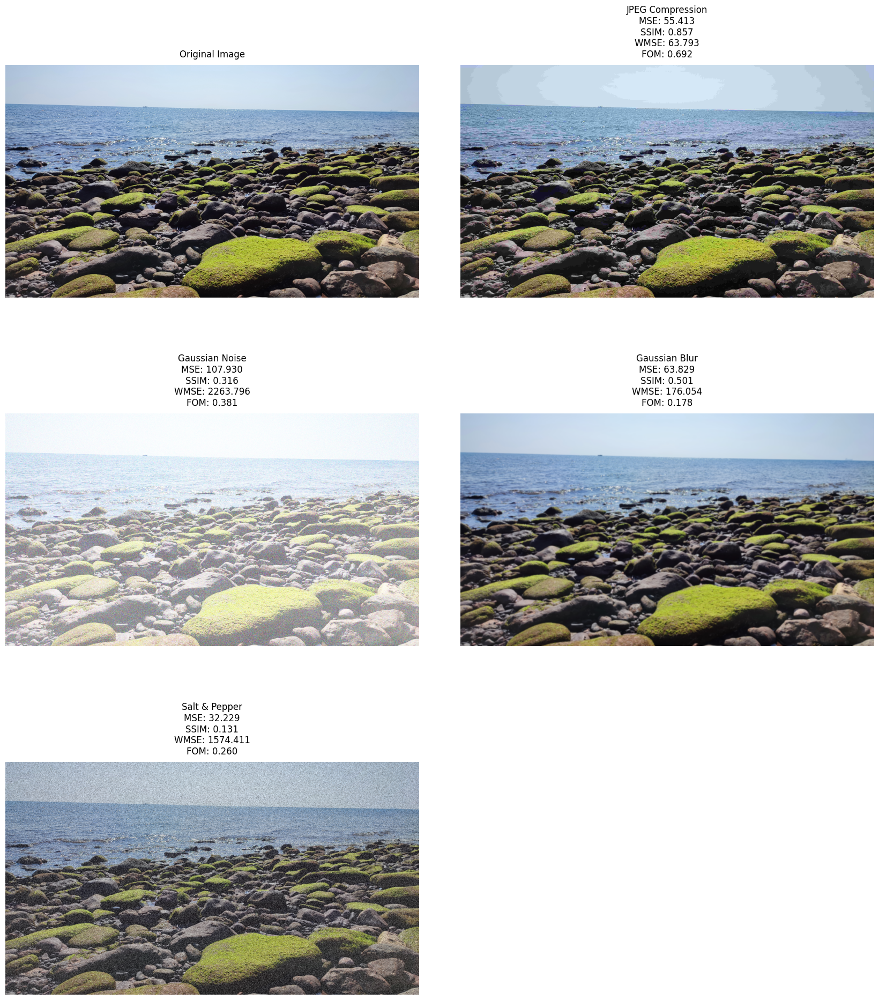


جدول مقایسه معیارهای کیفیت تصویر:
+------------------+--------+--------+---------+-------+
|    Distortion    |  MSE   |  SSIM  |  WMSE   |  FOM  |
+==================+========+========+=========+=======+
| JPEG Compression | 55.413 | 0.857  | 63.793  | 0.692 |
+------------------+--------+--------+---------+-------+
|  Gaussian Noise  | 107.93 | 0.316  | 2263.8  | 0.381 |
+------------------+--------+--------+---------+-------+
|  Gaussian Blur   | 63.829 | 0.501  | 176.054 | 0.178 |
+------------------+--------+--------+---------+-------+
|  Salt & Pepper   | 32.229 | 0.131  | 1574.41 | 0.26  |
+------------------+--------+--------+---------+-------+



[{'Distortion': 'JPEG Compression',
  'MSE': 55.413,
  'SSIM': 0.857,
  'WMSE': 63.793,
  'FOM': 0.692},
 {'Distortion': 'Gaussian Noise',
  'MSE': 107.93,
  'SSIM': 0.316,
  'WMSE': 2263.796,
  'FOM': 0.381},
 {'Distortion': 'Gaussian Blur',
  'MSE': 63.829,
  'SSIM': 0.501,
  'WMSE': 176.054,
  'FOM': 0.178},
 {'Distortion': 'Salt & Pepper',
  'MSE': 32.229,
  'SSIM': 0.131,
  'WMSE': 1574.411,
  'FOM': 0.26}]

In [3]:
compare_image_quality("IMG_20230131_130323.jpg")

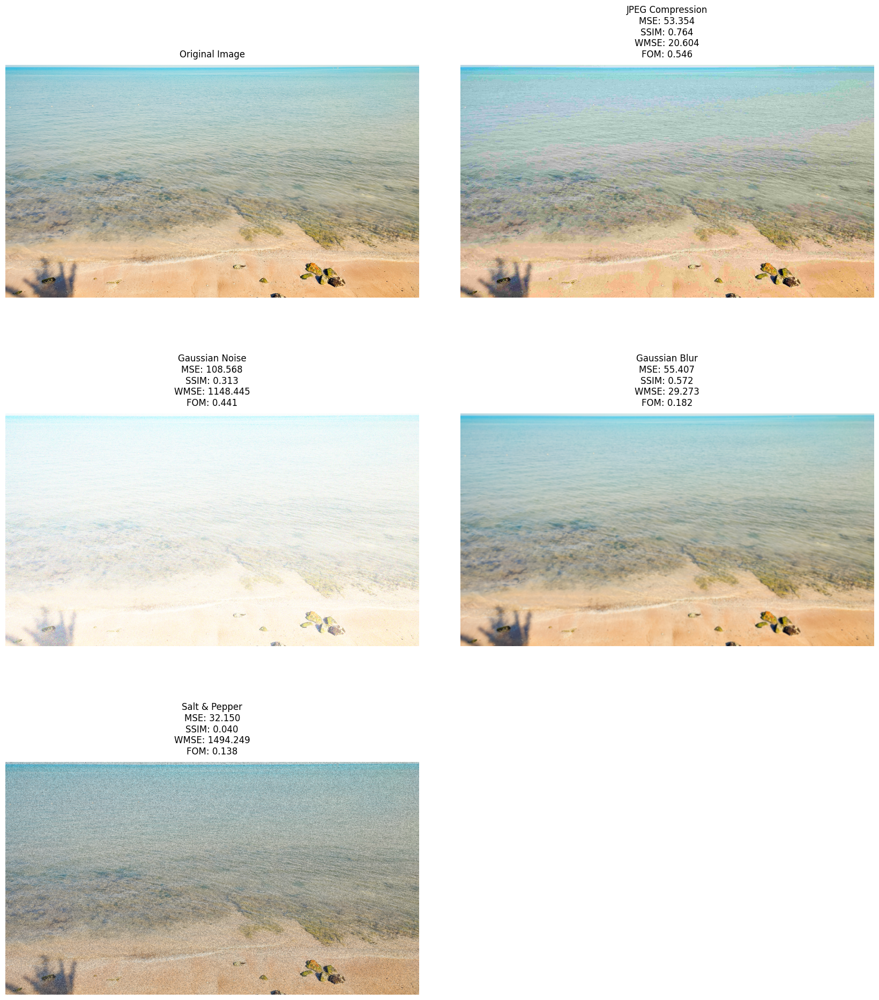


جدول مقایسه معیارهای کیفیت تصویر:
+------------------+---------+--------+---------+-------+
|    Distortion    |   MSE   |  SSIM  |  WMSE   |  FOM  |
+==================+=========+========+=========+=======+
| JPEG Compression | 53.354  | 0.764  | 20.604  | 0.546 |
+------------------+---------+--------+---------+-------+
|  Gaussian Noise  | 108.568 | 0.313  | 1148.44 | 0.441 |
+------------------+---------+--------+---------+-------+
|  Gaussian Blur   | 55.407  | 0.572  | 29.273  | 0.182 |
+------------------+---------+--------+---------+-------+
|  Salt & Pepper   |  32.15  |  0.04  | 1494.25 | 0.138 |
+------------------+---------+--------+---------+-------+



[{'Distortion': 'JPEG Compression',
  'MSE': 53.354,
  'SSIM': 0.764,
  'WMSE': 20.604,
  'FOM': 0.546},
 {'Distortion': 'Gaussian Noise',
  'MSE': 108.568,
  'SSIM': 0.313,
  'WMSE': 1148.445,
  'FOM': 0.441},
 {'Distortion': 'Gaussian Blur',
  'MSE': 55.407,
  'SSIM': 0.572,
  'WMSE': 29.273,
  'FOM': 0.182},
 {'Distortion': 'Salt & Pepper',
  'MSE': 32.15,
  'SSIM': 0.04,
  'WMSE': 1494.249,
  'FOM': 0.138}]

In [4]:
compare_image_quality("IMG_20230918_183255.jpg")

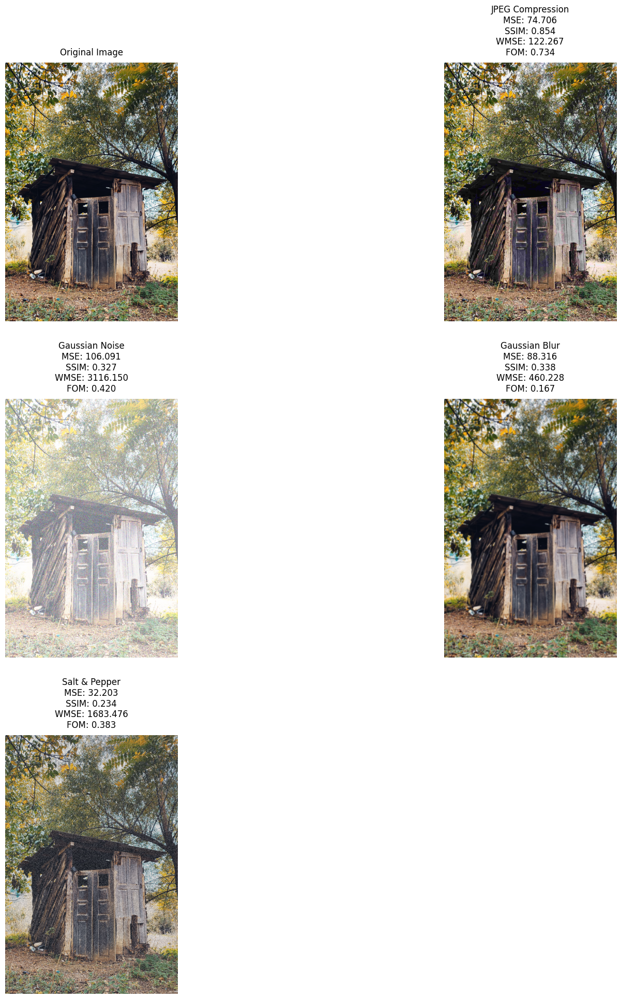


جدول مقایسه معیارهای کیفیت تصویر:
+------------------+---------+--------+---------+-------+
|    Distortion    |   MSE   |  SSIM  |  WMSE   |  FOM  |
+==================+=========+========+=========+=======+
| JPEG Compression | 74.706  | 0.854  | 122.267 | 0.734 |
+------------------+---------+--------+---------+-------+
|  Gaussian Noise  | 106.091 | 0.327  | 3116.15 | 0.42  |
+------------------+---------+--------+---------+-------+
|  Gaussian Blur   | 88.316  | 0.338  | 460.228 | 0.167 |
+------------------+---------+--------+---------+-------+
|  Salt & Pepper   | 32.203  | 0.234  | 1683.48 | 0.383 |
+------------------+---------+--------+---------+-------+



[{'Distortion': 'JPEG Compression',
  'MSE': 74.706,
  'SSIM': 0.854,
  'WMSE': 122.267,
  'FOM': 0.734},
 {'Distortion': 'Gaussian Noise',
  'MSE': 106.091,
  'SSIM': 0.327,
  'WMSE': 3116.15,
  'FOM': 0.42},
 {'Distortion': 'Gaussian Blur',
  'MSE': 88.316,
  'SSIM': 0.338,
  'WMSE': 460.228,
  'FOM': 0.167},
 {'Distortion': 'Salt & Pepper',
  'MSE': 32.203,
  'SSIM': 0.234,
  'WMSE': 1683.476,
  'FOM': 0.383}]

In [5]:
compare_image_quality("IMG_20230918_184402.jpg")

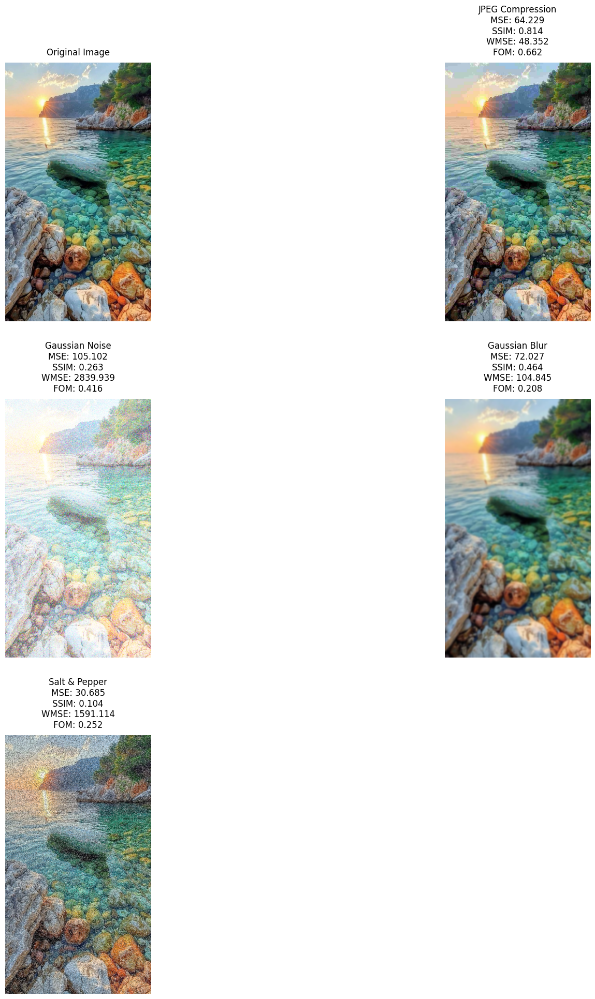


جدول مقایسه معیارهای کیفیت تصویر:
+------------------+---------+--------+---------+-------+
|    Distortion    |   MSE   |  SSIM  |  WMSE   |  FOM  |
+==================+=========+========+=========+=======+
| JPEG Compression | 64.229  | 0.814  | 48.352  | 0.662 |
+------------------+---------+--------+---------+-------+
|  Gaussian Noise  | 105.102 | 0.263  | 2839.94 | 0.416 |
+------------------+---------+--------+---------+-------+
|  Gaussian Blur   | 72.027  | 0.464  | 104.845 | 0.208 |
+------------------+---------+--------+---------+-------+
|  Salt & Pepper   | 30.685  | 0.104  | 1591.11 | 0.252 |
+------------------+---------+--------+---------+-------+



[{'Distortion': 'JPEG Compression',
  'MSE': 64.229,
  'SSIM': 0.814,
  'WMSE': 48.352,
  'FOM': 0.662},
 {'Distortion': 'Gaussian Noise',
  'MSE': 105.102,
  'SSIM': 0.263,
  'WMSE': 2839.939,
  'FOM': 0.416},
 {'Distortion': 'Gaussian Blur',
  'MSE': 72.027,
  'SSIM': 0.464,
  'WMSE': 104.845,
  'FOM': 0.208},
 {'Distortion': 'Salt & Pepper',
  'MSE': 30.685,
  'SSIM': 0.104,
  'WMSE': 1591.114,
  'FOM': 0.252}]

In [6]:
compare_image_quality("download (2).jpg")

<hr>
<div dir="rtl"><h3>برای نویز گاوسی، معیارهای MSE و WMSE مناسب‌اند، ولی SSIM فقط تغییر ساختار کلی را ثبت می‌کند و FOM هم عملکرد قابل قبولی دارد.<br><br>
 در بلور گاوسی، SSIM بهترین دقت را در رصد کاهش وضوح و نرم شدن لبه‌ها دارد، WMSE حساسیت بیشتری نسبت به MSE نشان می‌دهد و  FOM در سطح فابل فبول کار می‌کند. MSE یه تنهایی برای این نوع نویز بی فایده است.<br><br>
 برای نویز نمک و فلفل،  FOM گزینه بسیار مناسبی است ، در حالی که MSE و WMSE ممکن است عدد بزرگی بدهند و SSIM در این حالت اصلاً قابل اعتماد نیست.<br><br>
 در فشرده‌سازی تصویر، SSIM با ادراک بصری ما همخوانی خوبی دارد و بهترین معیار است، WMSE تا حدی بهتر از MSE عمل می‌کند، اما MSE و FOM عملکرد دقیقی ندارند و قابل اعتماد نیستند.

</h3></div>3></div>است.